<a href="https://colab.research.google.com/github/Siddysimon/lagonet/blob/main/LagophFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install tensorflow-addons

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Dropout
from tensorflow.keras.losses import sparse_categorical_crossentropy
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import os
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
import tensorflow_addons as tfa
import math


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
IMG_FOLDER = "/content/drive/My Drive/LagophPaper/Data/"
DS_FOLDER = "/content/drive/My Drive/LagophPaper/Dataset/"
BUFFER_SIZE = 0
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256
NEW_DS = False

EPOCHS = 64

In [ ]:
def createDS_kFold(folderList, folders_toSpare, skipImp = True):
  ii = 0
  ds_test = None
  ds_train = None
  folderList_toSpare = [folderList[i] for i in folders_toSpare]
  folderList = [x for x in folderList if x not in folderList_toSpare]
  for ii, folder in enumerate(folderList):
    if not os.path.exists(folder + "/df") or NEW_DS:
      list_x_folder = []
      list_y_folder = []
      imgs = glob.glob(folder + "/*.png")
      if skipImp:
        imgs = [img for img in imgs if "_imp_" not in img]
      for img in imgs:
        img_arr = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB)
        if "_hy_" in img:
          out = 0
        elif "_lt_" in img:
          out = 1
        elif "_imp_" in img:
          out = 2
        else:
          print("error")
        list_x_folder.append(img_arr)
        list_y_folder.append(out)
      ds_folder = tf.data.Dataset.from_tensor_slices((list_x_folder, list_y_folder))
      tf.data.experimental.save(ds_folder, folder + "/df")
    else:
      ds_folder = tf.data.experimental.load(folder + "/df")
    if ds_train is None:
      ds_train = ds_folder
    else:
      ds_train = tf.data.Dataset.concatenate(ds_train, ds_folder)

  for ii, folder in enumerate(folderList_toSpare):
    if not os.path.exists(folder + "/df")or NEW_DS:
      list_x_folder = []
      list_y_folder = []
      imgs = glob.glob(folder + "/*.png")
      if skipImp:
        imgs = [img for img in imgs if "_imp_" not in img]
      for img in imgs:
        img_arr = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB)
        if "_hy_" in img:
          out = 0
        elif "_lt_" in img:
          out = 1
        elif "_imp_" in img:
          out = 2
        else:
          print("error")
        list_x_folder.append(img_arr)
        list_y_folder.append(out)
      ds_folder = tf.data.Dataset.from_tensor_slices((list_x_folder, list_y_folder))
      tf.data.experimental.save(ds_folder, folder + "/df")
    else:
      ds_folder = tf.data.experimental.load(folder + "/df")
    if ds_test is None:
      ds_test = ds_folder
    else:
      ds_test = tf.data.Dataset.concatenate(ds_test, ds_folder)
    ii = len(list(ds_train))
    print(ii)
  return ds_train, ds_test, ii

In [ ]:
if NEW_DS:
  folderList = glob.glob(IMG_FOLDER + "/*/")
  folders_toSpare = [] #use first 3 Folders as validation set
  train_df, test_df, BUFFER_SIZE = createDS_kFold(folderList, folders_toSpare)
  tf.data.experimental.save(train_df, DS_FOLDER + "/train_df")
  tf.data.experimental.save(test_df, DS_FOLDER + "/test_df")


In [ ]:

if not NEW_DS:
  train_df = tf.data.experimental.load(DS_FOLDER + "/train_df")
  test_df = tf.data.experimental.load(DS_FOLDER + "/test_df")
  val_df = train_df.take(91)
  train_df = train_df.skip(91)

Instructions for updating:
Use `tf.data.Dataset.load(...)` instead.


In [ ]:
  print(len(train_df))
  print(len(test_df))
  BUFFER_SIZE =  9999999

826
91


In [ ]:
def getModel(input_shape):
  model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.25),  # Add a dropout layer with a dropout rate of 0.25
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.25),  # Add a dropout layer with a dropout rate of 0.25
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.25),  # Add a dropout layer with a dropout rate of 0.25
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # Add a dropout layer with a dropout rate of 0.5
    tf.keras.layers.Dense(1, activation='sigmoid')
  ])
  model.compile(optimizer=tf.keras.optimizers.Adam(lr = 0.00001), loss="binary_crossentropy", metrics=["accuracy", tf.keras.metrics.AUC(), tf.keras.metrics.SpecificityAtSensitivity(0.5), tf.keras.metrics.Recall(), tf.keras.metrics.Precision(), tf.keras.metrics.SensitivityAtSpecificity(0.5)])
  return model

In [ ]:
def resize(image, height, width):
  image = tf.image.resize(image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return image

In [ ]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(image):
  image = (tf.cast(image, tf.float32) / 127.5) - 1

  return image

In [ ]:
augmentation = Sequential()
augmentation.add(tf.keras.layers.RandomTranslation((-0.10, 0.10), (-0.10, 0.10), fill_mode='reflect', interpolation='bilinear'))
augmentation.add(tf.keras.layers.RandomContrast(0.5))
#augmentation.add(tf.keras.layers.GaussianNoise(250))
@tf.function()
def random_jitter(image):
  # Resizing to 286x286
  rs = tf.random.uniform(shape=(), minval=256, maxval=312, dtype=tf.int32)
  image = resize(image, rs, rs)
  degrees = (tf.random.uniform(())*2-1) * 10
  image = tfa.image.rotate(image, degrees*math.pi/180, fill_mode="nearest")

  image = tf.image.random_hue(image, 0.02)
  image = tf.image.random_saturation(image, 0.6, 1.6)

  image = augmentation(image)
  image = tf.cast(image, tf.float32)

  rn = 25
  noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=rn, dtype=tf.float32)
  image = tf.add(image, noise)
  image = tf.clip_by_value(image, 0, 255)



  # Random cropping back to 256x256
  image = random_crop(image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    image = tf.image.flip_left_right(image)

  return image

In [ ]:
def load(inp_list):
  input_image = inp_list[0]
  y = inp_list[1]
  input_image = tf.cast(input_image, tf.float32)

  return input_image, y

In [ ]:
def load_image_train(image, y):
  #image = load(image)
  image = random_jitter(image)
  image = normalize(image)

  return image, y

In [ ]:
def load_image_test(image, y):
  #image = load(image)
  image = resize(image, IMG_HEIGHT, IMG_WIDTH)
  image = normalize(image)

  return image, y

In [ ]:
train_dataset = train_df
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

tf.Tensor(0, shape=(), dtype=int32)


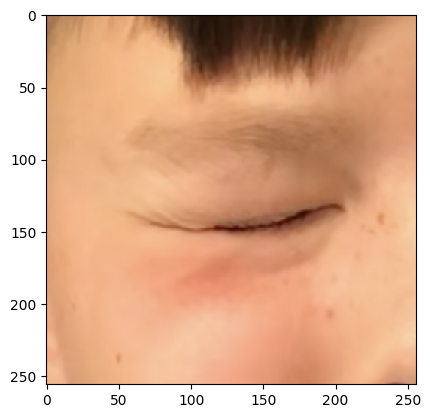

In [ ]:
inp, re = load(next(iter(train_df.take(1))))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
print(re)

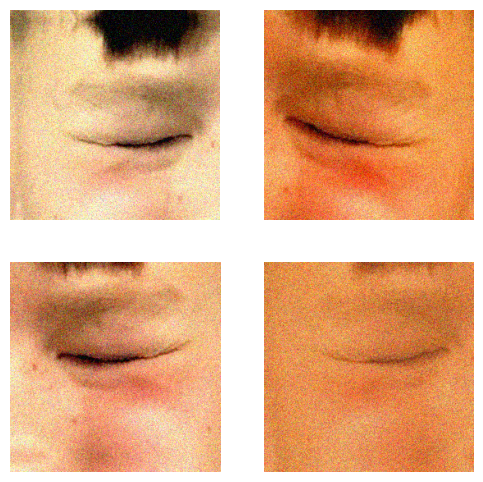

In [ ]:
inp, re = load(next(iter(train_df.take(1))))
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp= random_jitter(inp)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp/255)
  plt.axis('off')
plt.show()

In [ ]:
try:
  test_dataset = test_df
except tf.errors.InvalidArgumentError:
  test_dataset = test_df
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

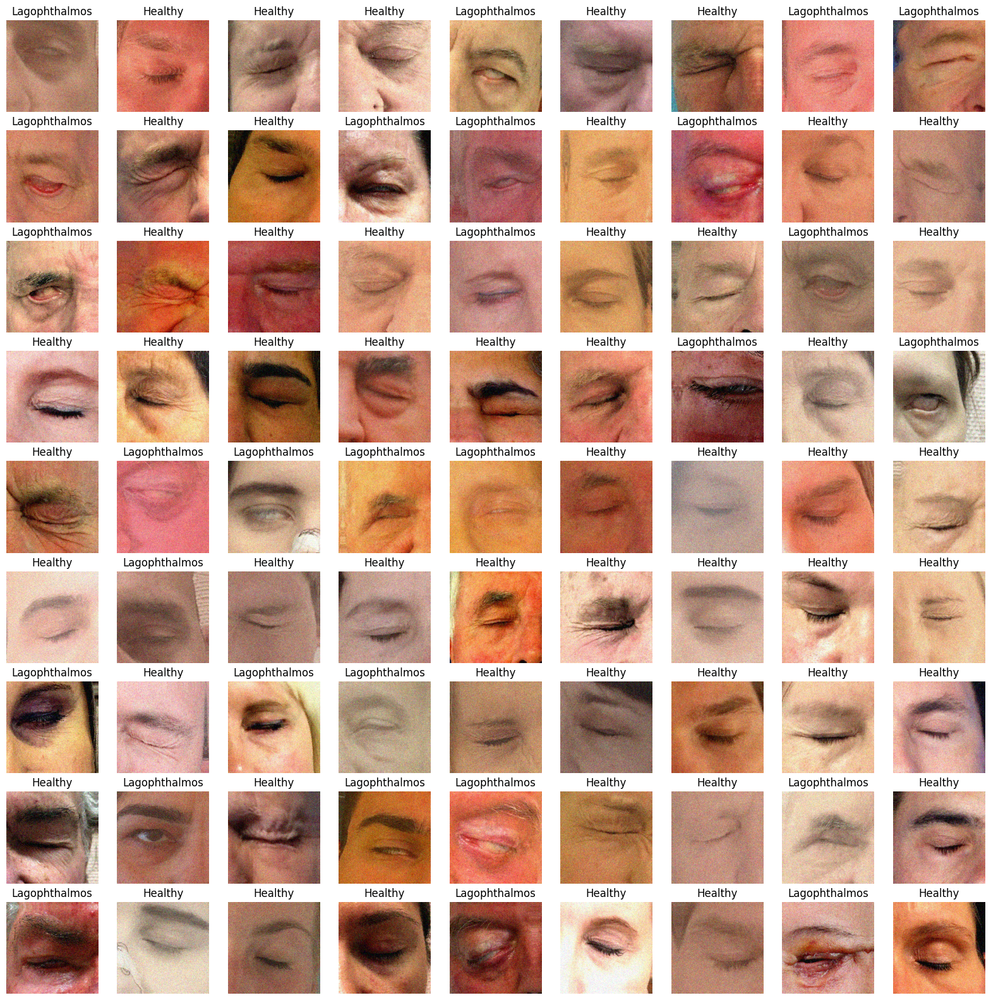

In [ ]:
plot_examples = True
if plot_examples:
  plt.figure(figsize=(20, 20))
  ds = iter(train_dataset.take(81))
  for i in range(81):
    inp, re = load(next(ds))
    plt.subplot(9, 9, i + 1)
    if re.numpy()[0] == 0:
      name = "Healthy"
    elif re.numpy()[0] == 1:
      name = "Lagophthalmos"
    else:
      name = "impl"
    plt.title(name)
    plt.imshow(inp[0,...]/2+0.5)
    plt.axis('off')
  plt.show()

In [ ]:
model = getModel((IMG_HEIGHT, IMG_WIDTH, 3))
tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)
model.summary()

In [ ]:
filepath="/content/drive/My Drive/LagophPaper/model_1/weights/weights-improvement-{epoch:02d}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
logs = tf.keras.callbacks.TensorBoard(log_dir='/content/drive/My Drive/LagophPaper/model_1/logs')
early = tf.keras.callbacks.EarlyStopping(patience=100)
update = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.8, patience=10, min_lr=0.0001)
callbacks_list = [checkpoint, logs, early, update]

In [ ]:
EPOCHS = 64
history = model.fit(train_dataset, validation_data= val_dataset, callbacks=callbacks_list, epochs=EPOCHS)

In [ ]:
loss = [h-0.2 for h in history.history['loss']]
print(sum(history.history['accuracy'])/len(history.history['accuracy']))
val_loss = [h-0.2 for h in history.history['val_loss']]
print(min(val_loss))
line1, = plt.plot(loss)
line2, = plt.plot(val_loss)
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend([line1, line2], ["Training", "Testing"])
#plt.legend(['Training'], ['Testing'], loc='upper left')
plt.show()

In [ ]:
for e in tf.train.summary_iterator("/content/drive/My Drive/LagophPaper/"+model_name+"/logs/validation/events.out.tfevents.1685474120.c7457c7374c1.1598.1.v2"):
    for v in e.summary.value:
        if v.tag == 'loss' or v.tag == 'accuracy':
            print(v.simple_value)

In [ ]:
#### K-Fold-Validation ######
EPOCHS = 300
NEW_DS = False
folderList = glob.glob(IMG_FOLDER + "/*/")
test_accuracies = []
model_name = "kFold_1"
if os.path.exists("/content/drive/My Drive/LagophPaper/"+model_name+"/accuracies.txt"):
  with open("/content/drive/My Drive/LagophPaper/"+model_name+"/accuracies.txt", 'r') as filehandle:
    for line in filehandle:
        currentAcc = line[:-1]
        test_accuracies.append(float(currentAcc))

for ii in range(0, 44, 5):
  filepath="/content/drive/My Drive/LagophPaper/"+model_name+"/model_{folder_1}_to_{folder_2}/weights/best_weights.hdf5".format(folder_1 = ii, folder_2 = ii)
  if not os.path.exists(filepath):
    folders_toSpare = [ii, ii+1, ii+2, ii+3, ii+4]
    train_df, test_df, BUFFER_SIZE = createDS_kFold(folderList, folders_toSpare)
    BUFFER_SIZE =  len(list(train_df))

    train_dataset = train_df
    train_dataset = train_dataset.map(load_image_train,
                                      num_parallel_calls=tf.data.AUTOTUNE)
    train_dataset = train_dataset.shuffle(BUFFER_SIZE)
    train_dataset = train_dataset.batch(BATCH_SIZE)

    try:
      test_dataset = test_df
    except tf.errors.InvalidArgumentError:
      test_dataset = test_df
    test_dataset = test_dataset.map(load_image_test)
    test_dataset = test_dataset.batch(BATCH_SIZE)

    model = getModel((IMG_HEIGHT, IMG_WIDTH, 3))

    checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')
    early = tf.keras.callbacks.EarlyStopping(patience=50, monitor = "accuracy")
    update = tf.keras.callbacks.ReduceLROnPlateau(monitor="accuracy", factor=0.5, patience=5, min_lr=0.0001)
    callbacks_list = [checkpoint, early, update]

    model.fit(train_dataset, callbacks=callbacks_list, epochs=EPOCHS)

    results = model.evaluate(test_dataset)
    #test_losses.append(results[0])
    test_accuracies.append(results[1])
    print(test_accuracies)

    textfile = open("/content/drive/My Drive/LagophPaper/"+model_name+"/accuracies.txt", "w")
    for element in test_accuracies:
        textfile.write(str(element) + "\n")
    textfile.close()




In [ ]:
test_losses = np.array(test_losses)
test_accuracies = np.array(test_accuracies)
print(test_losses)
print(test_accuracies)
print(np.mean(test_losses))
print(np.mean(test_accuracies))
hist(test_losses)
hist(test_accuracies)
np.save("/content/drive/My Drive/LagophPaper/kFold_1/test_losses.npy", test_losses)
np.save("/content/drive/My Drive/LagophPaper/kFold_1/test_accuracies.npy", test_accuracies)

In [ ]:
# Restoring the latest weights
#if os.path.exists("/content/drive/My Drive/LagophPaper/model_2/weights/.hdf5"):
#  model.load_weights("/content/drive/My Drive/LagophPaper/model_2/weights/.hdf5")

91/91 [==============================] - 1s 12ms/step - loss: 0.2234 - accuracy: 0.9341 - precision_12: 0.9565 - recall_12: 0.8148 - specificity_at_sensitivity: 1.0000 - auc: 0.9780
test loss, test acc: {'loss': 0.22337211668491364, 'accuracy': 0.9340659379959106, 'precision_12': 0.95652174949646, 'recall_12': 0.8148148059844971, 'specificity_at_sensitivity': 1.0, 'auc': 0.9780092835426331}
1/1 [==============================] - 0s 233ms/step


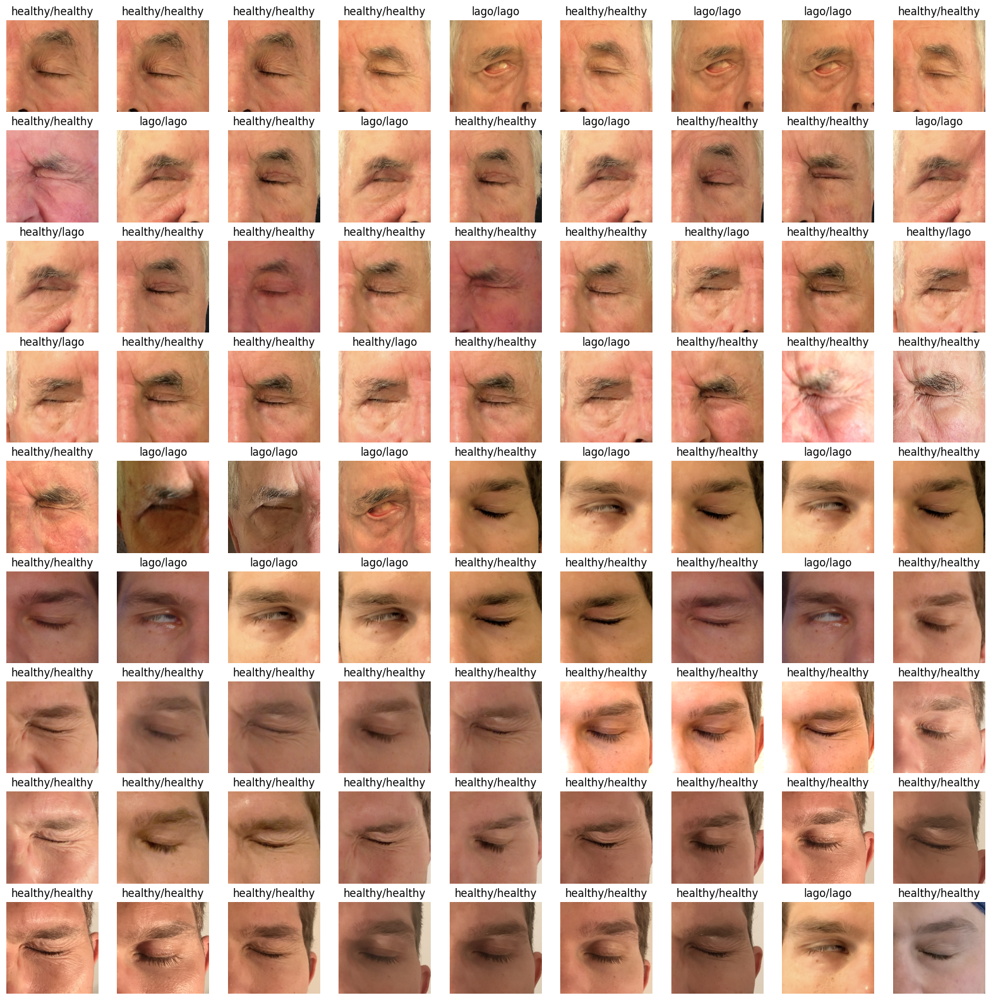

In [ ]:
results = model.evaluate(test_dataset)
print("test loss, test acc:", results)

plt.figure(figsize=(20, 20))
ds = iter(test_dataset.take(81))
for i in range(min(len(test_dataset), 81)):
  inp, re = load(next(ds))
  pre = model.predict(inp)
  plt.subplot(9, 9, i + 1)
  if pre[0] < 0.5:
    name = "healthy"
  elif pre[0] >= 0.5:
    name = "lago"
  else:
    name = "impl"
  if re.numpy()[0] == 0:
    gt = "healthy"
  elif re.numpy()[0] == 1:
    gt = "lago"
  else:
    gt = "impl"
  plt.title(name + "/" + gt)
  plt.imshow(inp[0,...]/2+0.5)
  plt.axis('off')
plt.show()